In [1]:
# Monitorization
import comet_ml
from comet_ml import start

import os

# Data
import numpy as np
import pandas as pd

# Audio
import librosa
import librosa.display

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

# Machine Learning
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, CSVLogger, ReduceLROnPlateau
from sklearn.utils import shuffle
import tensorflow.keras.backend as K

# Deep Learning Visualization
from sklearn.metrics import confusion_matrix

# Configurar el estilo de los gráficos
sns.set(style="ticks")

2024-11-28 10:38:32.198062: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-28 10:38:32.224557: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-28 10:38:32.224579: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-28 10:38:32.225449: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-28 10:38:32.230761: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-28 10:38:32.231704: I tensorflow/core/platform/cpu_feature_guard.cc:1

# Undestanding the Dataset
We have downloaded the Dataset Best of Watkins Marine Mammals from kaggle. It contains 37 classes, each of them with .wav files that contains sounds of each of the classes.

## Load Data

In [2]:
# !ls ../../Dataset/Audios/Watkins\ Marine\ Mammals

In [3]:
# # Main Folder with all classes and files
# main_folder = '../../Dataset/Audios/Watkins Marine Mammals/'

# # Folder contains subfolders = classes and in them, the audio sample
# classes = os.listdir(main_folder)

# # delete README.MD
# classes.remove('README.MD')

# # Create an empty list to store the audio file paths
# audio_files = []

# # Loop through all the subfolders and files
# for subfolder in classes:
#     # Get the list of all files in the subfolder
#     files = os.listdir(main_folder + subfolder)
#     # Loop through all the files
#     for f in files:
#         # Get the full path of the file
#         audio_files.append(main_folder + subfolder + '/' + f)

In [4]:
# df = pd.DataFrame(audio_files, columns=['File'])

# # Add class
# df['Class'] = df['File'].apply(lambda x: x.split('/')[-2])

In [5]:
# # Number of files per class and duration of each file
# for f in audio_files:
#     # Load the audio file
#     x, sr = librosa.load(f)
#     # Duration of the audio file
#     duration = librosa.get_duration(y=x, sr=sr)
#     # Add the duration to the duration list
#     df.loc[df['File'] == f, 'Duration'] = duration


# # Create an empty list to store the audio file paths
# audio_files = []


In [6]:
# # Save as CSV
# df.to_csv('../../Dataset/CSVs/WatkinsMarineMammals.csv', index=False)

Data was loaded from the folders and it was made a dataframe that has been saved as a csv so it can directly be loaded from the CSV which contains each file path, the class and the duration of the segment. We will load the CSV directly:

In [7]:
# Load CSV
df = pd.read_csv('../../Dataset/CSVs/WatkinsMarineMammals.csv')
df

,File,Class,Duration
0,../../Dataset/Audios/Watkins Marine Mammals/Wh...,White_sidedDolphin,2.521905
1,../../Dataset/Audios/Watkins Marine Mammals/Wh...,White_sidedDolphin,2.069887
2,../../Dataset/Audios/Watkins Marine Mammals/Wh...,White_sidedDolphin,2.215329
3,../../Dataset/Audios/Watkins Marine Mammals/Wh...,White_sidedDolphin,2.742222
4,../../Dataset/Audios/Watkins Marine Mammals/Wh...,White_sidedDolphin,1.437052
...,...,...,...
15527,../../Dataset/Audios/Watkins Marine Mammals/Ri...,RingedSeal,0.458639
15528,../../Dataset/Audios/Watkins Marine Mammals/Ri...,RingedSeal,0.334014
15529,../../Dataset/Audios/Watkins Marine Mammals/Ri...,RingedSeal,1.418005
15530,../../Dataset/Audios/Watkins Marine Mammals/Ri...,RingedSeal,0.773469


Let's check classes distribution:

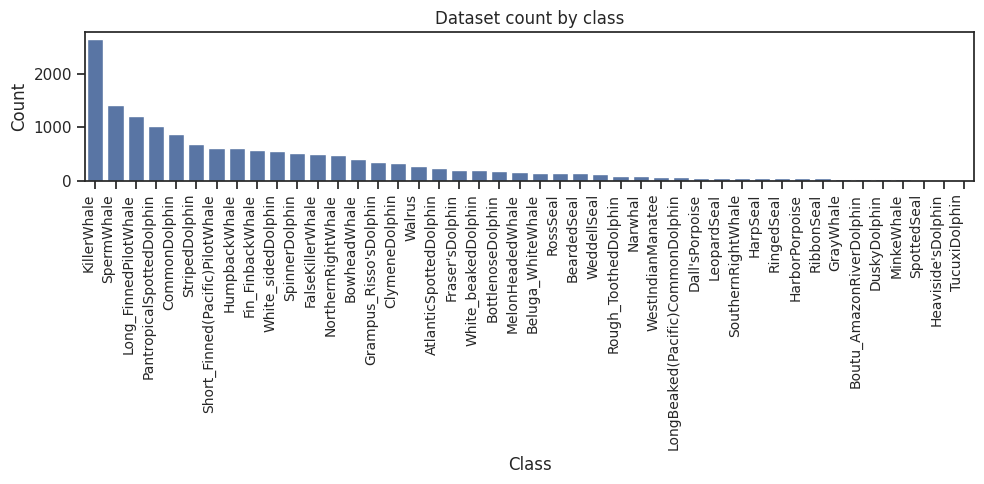

In [8]:
# Bar plot of dataset count sorted by count
plt.figure(figsize=(10, 5))
sorted_df = df['Class'].value_counts().reset_index()
sorted_df.columns = ['Class', 'Count']
sns.barplot(data=sorted_df, x='Class', y='Count', order=sorted_df['Class'])
plt.title('Dataset count by class')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

In [9]:
# # show alphabetically by class name
# sorted_df.sort_values(by='Class')

In [10]:
# # 10 classes with the less files
# df['Class'].value_counts().tail(15)

We will remove those classes that have less than 10 samples:

In [11]:
# # delete classes with less than 10 files
# df = df[df['Class'] != 'GraySeal']
# df = df[df['Class'] != 'StellerSeaLion']
# df = df[df['Class'] != 'IrawaddyDolphin']
# df = df[df['Class'] != 'BlueWhale']
# df = df[df['Class'] != 'SeaOtter']
# df = df[df['Class'] != 'FinlessPorpoise']
# df = df[df['Class'] != 'NewZealandFurSeal']
# df = df[df['Class'] != 'HoodedSeal']
# df = df[df['Class'] != 'Commerson\'sDolphin']
# df = df[df['Class'] != 'HarbourSeal']

# # Also delete folders from directory
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/GraySeal'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/StellerSeaLion'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/IrawaddyDolphin'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/BlueWhale'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/SeaOtter'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/FinlessPorpoise'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/NewZealandFurSeal'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/HoodedSeal'
# # !rm -r '../../Dataset/Audios/Watkins Marine Mammals/Commerson'sDolphin'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/HarbourSeal'

In [12]:
# Long_FinnedPilotWhale, StripedDolphin, SpermWhale, KillerWhale, HumpbackWhale, CommonDolphin, BottlenoseDolphin, MinkeWhale, Fin_FinbackWhale are important_species
important_species = ['Long_FinnedPilotWhale', 'StripedDolphin', 'SpermWhale', 'KillerWhale', 'HumpbackWhale', 'CommonDolphin', 'BottlenoseDolphin', 'MinkeWhale', 'Fin_FinbackWhale']

In green we highlight the classes present in the Strait of Gibraltar.

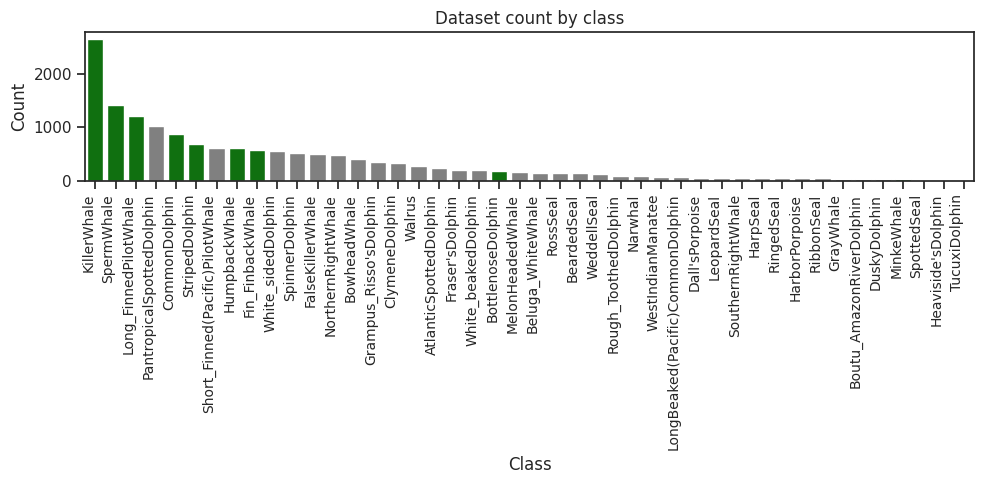

In [13]:
sorted_df = df['Class'].value_counts().reset_index()
sorted_df.columns = ['Class', 'Count']

# Create a new column to indicate if the species is important
sorted_df['Important'] = sorted_df['Class'].apply(lambda x: 'Important' if x in important_species else 'Not Important')

# Bar plot of dataset count with colors for important species
plt.figure(figsize=(10, 5))
sns.barplot(data=sorted_df, x='Class', y='Count', hue='Important', palette={'Important': 'green', 'Not Important': 'gray'})
plt.title('Dataset count by class')
plt.xticks(rotation=90, ha='right', fontsize=10)
plt.tight_layout()
plt.legend([],[], frameon=False)
plt.show()

/tmp/ipykernel_142186/1489400612.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Conjunto de Datos')


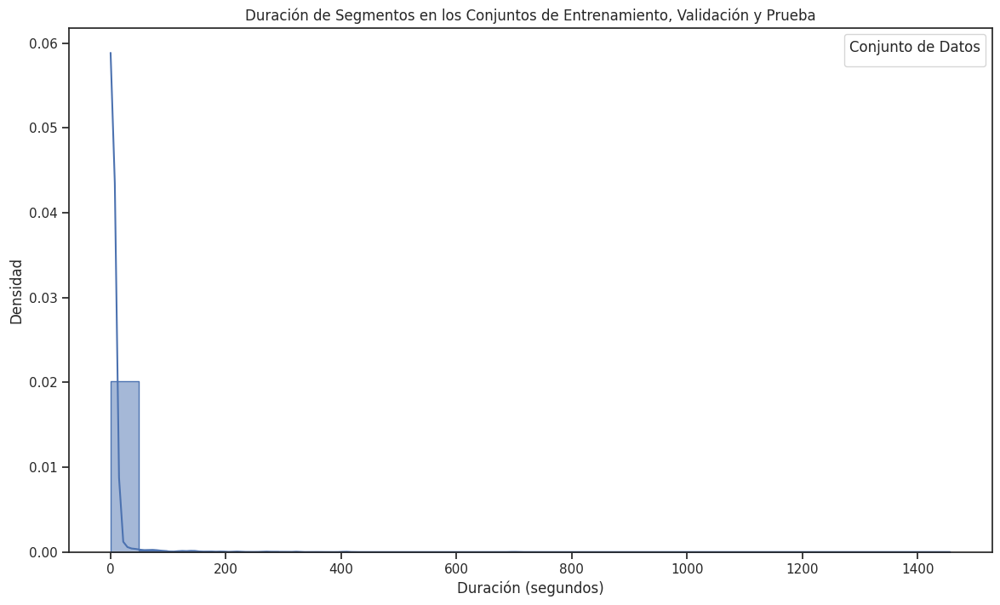

In [14]:
# Crear el gráfico de duración de audios
plt.figure(figsize=(14, 8))
sns.histplot(data=df, x='Duration', element='step', stat='density', common_norm=False, bins=30, kde=True)
plt.title('Duración de Segmentos en los Conjuntos de Entrenamiento, Validación y Prueba')
plt.xlabel('Duración (segundos)')
plt.ylabel('Densidad')
plt.legend(title='Conjunto de Datos')
plt.show()

In [15]:
# prijt number of audios with more than 3 seconds duration, 3 seconds duration and less than 3 seconds duration
print(f"Number of audios with less than 3 seconds duration: {len(df[df['Duration'] < 3])}")
print(f"Number of audios with 3 seconds duration: {len(df[df['Duration'] == 3])}")
print(f"Number of audios with more than 3 seconds duration: {len(df[df['Duration'] > 3])}")

Number of audios with less than 3 seconds duration: 11698
Number of audios with 3 seconds duration: 14
Number of audios with more than 3 seconds duration: 3820


/tmp/ipykernel_142186/584332889.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Conjunto de Datos')


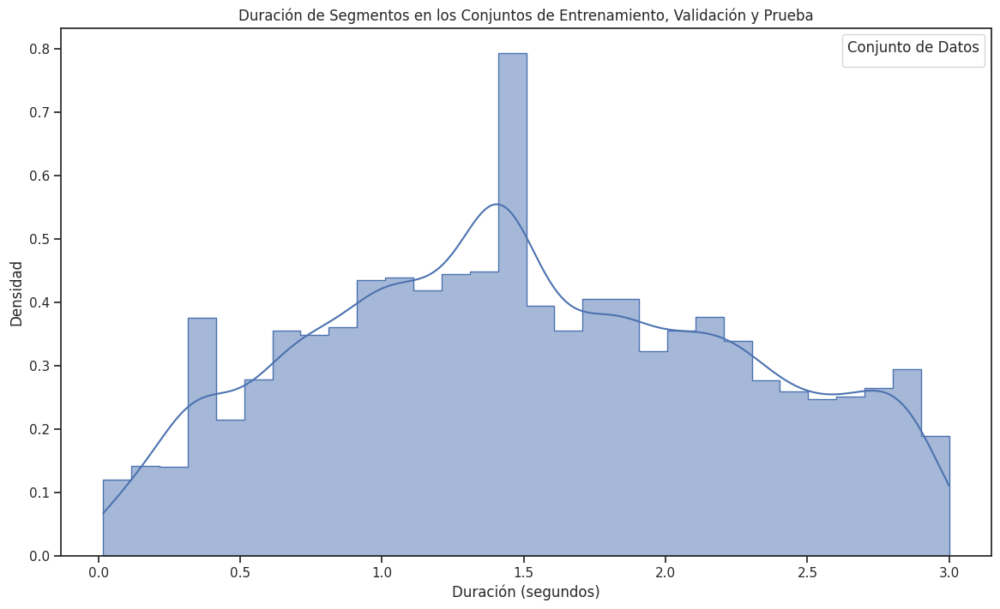

In [16]:
plt.figure(figsize=(14, 8))
sns.histplot(data=df[df['Duration'] < 3], x='Duration', element='step', stat='density', common_norm=False, bins=30, kde=True)
plt.title('Duración de Segmentos en los Conjuntos de Entrenamiento, Validación y Prueba')
plt.xlabel('Duración (segundos)')
plt.ylabel('Densidad')
plt.legend(title='Conjunto de Datos')
plt.show()

In [17]:
# dont limitate length of column in print
pd.set_option('display.max_colwidth', None)
# top 10 files with the most duration
df.sort_values(by='Duration', ascending=False).head(10)

,File,Class,Duration
10578,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/9004600V.wav,SpermWhale,1455.931701
10153,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/8401600B.wav,SpermWhale,1260.000000
3829,../../Dataset/Audios/Watkins Marine Mammals/Short_Finned(Pacific)PilotWhale/8401600B.wav,Short_Finned(Pacific)PilotWhale,1260.000000
10152,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/9400500C.wav,SpermWhale,1220.100680
10739,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/9500100Q.wav,SpermWhale,1179.215374
9786,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/7200900P.wav,SpermWhale,1162.098322
14506,../../Dataset/Audios/Watkins Marine Mammals/Fin_FinbackWhale/78014002.wav,Fin_FinbackWhale,1104.000000
14540,../../Dataset/Audios/Watkins Marine Mammals/Fin_FinbackWhale/78014001.wav,Fin_FinbackWhale,1104.000000
8132,../../Dataset/Audios/Watkins Marine Mammals/HumpbackWhale/6301901L.wav,HumpbackWhale,709.056780
9950,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/90011001.wav,SpermWhale,698.684036


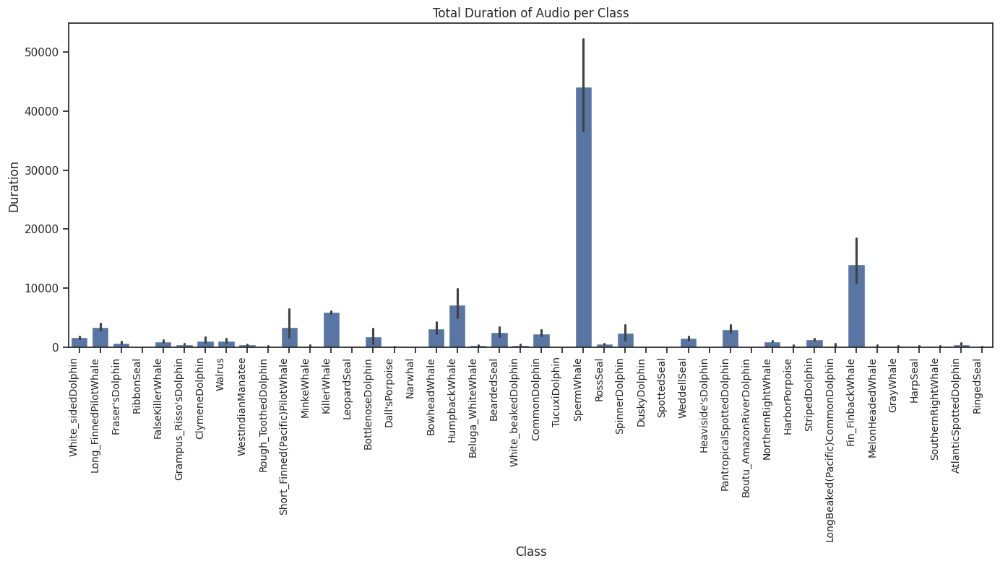

In [18]:
# Plot total duration of audio per class
plt.figure(figsize=(14, 8))
sns.barplot(data=df, x='Class', y='Duration', estimator=sum)
plt.title('Total Duration of Audio per Class')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

### Split Dataset

Create train, validation and test datasets in 80%, 10% and 10% respectively.
Also create classes dictionary to map the classes to integers, alphabetically sorted.

In [19]:
def split_dataset(df, train_size=0.8, val_size=0.1, test_size=0.1):
    # Split the dataset into training, validation and test sets
    df_train, df_val = train_test_split(df, test_size=1-train_size, random_state=42, stratify=df['Class'])
    df_val, df_test = train_test_split(df_val, test_size=(test_size/(val_size+test_size)), random_state=42, stratify=df_val['Class'])

    # Create classes mapping alphabetically
    classes = df['Class'].unique()
    classes.sort()
    classes_mapping = {classes[i]: i for i in range(len(classes))}
    # Reverse the classes_mapping dictionary
    reverse_classes_mapping = {v: k for k, v in classes_mapping.items()}

    df_train = df_train.sample(frac=1).reset_index(drop=True)
    df_val = df_val.sample(frac=1).reset_index(drop=True)
    df_test = df_test.sample(frac=1).reset_index(drop=True)

    return df_train, df_val, df_test, classes, classes_mapping, reverse_classes_mapping

def plot_split(df_train, df_val, df_test):
    # Combine the datasets with an additional column indicating the set
    df_train['Set'] = 'Train'
    df_val['Set'] = 'Validation'
    df_test['Set'] = 'Test'

    # Concatenate all dataframes
    df_combined = pd.concat([df_train, df_val, df_test])

    # Plot number of files per class in each set not stacked
    plt.figure(figsize=(14, 8))
    sns.countplot(data=df_combined, x='Class', hue='Set')
    plt.title('Number of Files per Class in Each Set')
    plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
    plt.legend(title='Set')
    plt.tight_layout()  # Adjust layout to make room for labels
    plt.show()

In [20]:
df = pd.read_csv('../../Dataset/CSVs/WatkinsMarineMammals.csv')
df_train, df_val, df_test, classes, classes_mapping, reverse_classes_mapping = split_dataset(df, train_size=0.8, val_size=0.1, test_size=0.1)

In [21]:
classes_mapping

{'AtlanticSpottedDolphin': 0,
 'BeardedSeal': 1,
 'Beluga_WhiteWhale': 2,
 'BottlenoseDolphin': 3,
 'Boutu_AmazonRiverDolphin': 4,
 'BowheadWhale': 5,
 'ClymeneDolphin': 6,
 'CommonDolphin': 7,
 "Dall'sPorpoise": 8,
 'DuskyDolphin': 9,
 'FalseKillerWhale': 10,
 'Fin_FinbackWhale': 11,
 "Fraser'sDolphin": 12,
 "Grampus_Risso'sDolphin": 13,
 'GrayWhale': 14,
 'HarborPorpoise': 15,
 'HarpSeal': 16,
 "Heaviside'sDolphin": 17,
 'HumpbackWhale': 18,
 'KillerWhale': 19,
 'LeopardSeal': 20,
 'LongBeaked(Pacific)CommonDolphin': 21,
 'Long_FinnedPilotWhale': 22,
 'MelonHeadedWhale': 23,
 'MinkeWhale': 24,
 'Narwhal': 25,
 'NorthernRightWhale': 26,
 'PantropicalSpottedDolphin': 27,
 'RibbonSeal': 28,
 'RingedSeal': 29,
 'RossSeal': 30,
 'Rough_ToothedDolphin': 31,
 'Short_Finned(Pacific)PilotWhale': 32,
 'SouthernRightWhale': 33,
 'SpermWhale': 34,
 'SpinnerDolphin': 35,
 'SpottedSeal': 36,
 'StripedDolphin': 37,
 'TucuxiDolphin': 38,
 'Walrus': 39,
 'WeddellSeal': 40,
 'WestIndianManatee': 41,
 

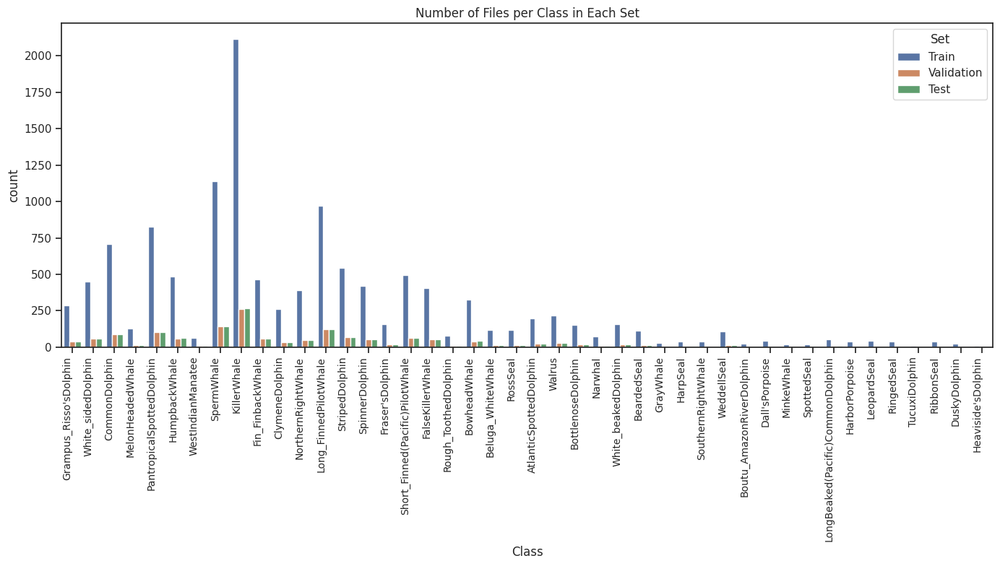

In [25]:
plot_split(df_train, df_val, df_test)

In [26]:
# check if there are files of all classes in each set
print('Classes in Train set:', df_train['Class'].nunique())
print('Classes in Validation set:', df_val['Class'].nunique())
print('Classes in Test set:', df_test['Class'].nunique())

# check not common classes between sets
train_classes = set(df_train['Class'].unique())
val_classes = set(df_val['Class'].unique())
test_classes = set(df_test['Class'].unique())

# Classes in Train set but not in Validation set
print('Classes in Train set but not in Validation set:', train_classes - val_classes)
print('Classes in Train set but not in Test set:', train_classes - test_classes)
print('Classes in Validation set but not in Train set:', val_classes - train_classes)

Classes in Train set: 44
Classes in Validation set: 44
Classes in Test set: 44
Classes in Train set but not in Validation set: set()
Classes in Train set but not in Test set: set()
Classes in Validation set but not in Train set: set()


# Functions

In [27]:
def plot_results(df_results, reverse_classes_mapping=reverse_classes_mapping, mode='random', classes=None):
    # If classes, select only specific classes
    if classes:
        df_results = df_results[df_results['PredictedClass'].isin(classes)]

    # Highest confidence
    if mode == 'max':
        # Select the 25 samples with the highest confidence
        samples = df_results.sort_values(by='Confidence', ascending=False).head(25)
    # Lowest confidence
    elif mode == 'min':
        # Select the 25 samples with the lowest confidence
        samples = df_results.sort_values(by='Confidence').head(25)
    # Random
    else: # mode == 'random':
        # Select 25 random samples
        samples = df_results.sample(25, random_state=42)

    # Create a grid of plots
    fig, axes = plt.subplots(5, 5, figsize=(20, 20))

    # Flatten the axes
    axes = axes.ravel()

    # Loop through all the samples
    for i, (_, row) in enumerate(samples.iterrows()):
        # Get the true and predicted labels
        true_label = reverse_classes_mapping[row['True']]
        pred_label = reverse_classes_mapping[row['Predicted']]
        confidence = row['Confidence']
        
        # Get the color of the label
        color = 'green' if true_label == pred_label else 'red'
        
        # Calculate the mel spectrogram
        mel_spectrogram = librosa.feature.melspectrogram(y=row['Signal'], sr=48000)
        mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
        
        # Plot the mel spectrogram
        axes[i].imshow(mel_spectrogram, origin='lower')
        axes[i].set_title(f"True: {true_label}\nPred: {pred_label} ({confidence:.2f})", color=color)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

## Preprocess Audios

As most audios are 3 seconds more or less, the time windows that will be used will be 3 seconds

Sampling rate was 256000 but BirdNET takes 48000, so 48000 will be used. It just changes the resolution of the audio.

Class: Grampus_Risso'sDolphin


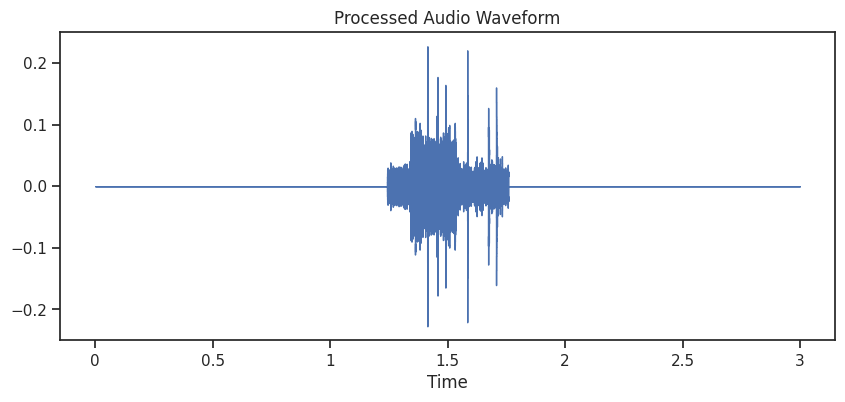

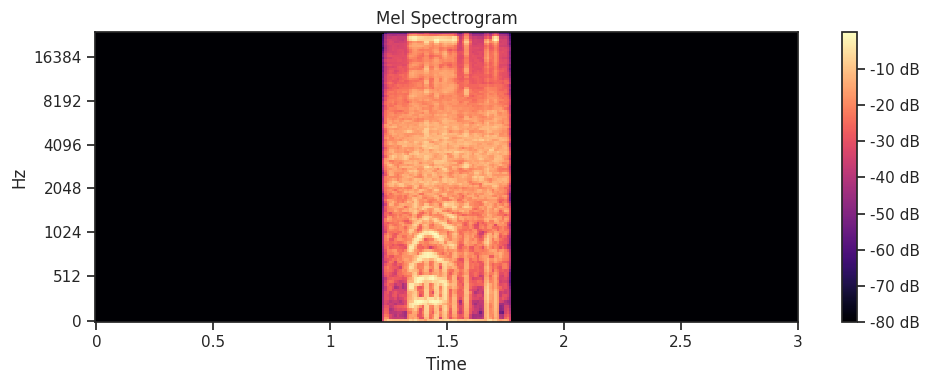

In [28]:
# Function to preprocess audio
def preprocess_audio(file_path, target_sr=48000, duration=3):
    # Load audio
    signal, sr = librosa.load(file_path, sr=target_sr, mono=True)
    
    # Calculate the maximum length in samples
    max_length = target_sr * duration  # e.g., 48000 * 3
    
    # If the signal is shorter than the desired length, pad with silence
    if len(signal) < max_length:
        padding = max_length - len(signal)
        pad_left = padding // 2
        pad_right = padding - pad_left
        signal = np.pad(signal, (pad_left, pad_right), mode='constant')
        return [signal]
    
    # If the signal is longer than the desired length, split into 3-second windows
    elif len(signal) > max_length:
        # first cut the signal so it will split in multiples of 3
        signal = signal[:-(len(signal) % max_length)]
        segments = []
        for start in range(0, len(signal), max_length):
            end = start + max_length
            segment = signal[start:end]
            if len(segment) < max_length:
                segment = np.pad(segment, (0, max_length - len(segment)), mode='constant')
            if len(segment) >= target_sr:  # Ensure segment is at least 1 second long
                if len(segment) < max_length:
                    padding = max_length - len(segment)
                    pad_left = padding // 2
                    pad_right = padding - pad_left
                    segment = np.pad(segment, (pad_left, pad_right), mode='constant')
                segments.append(segment)
        return segments
    
    # If the signal is exactly the desired length, return as is
    else:
        return [signal]

# Test preprocess on a single file
sample_file = os.path.join(df_train["File"][0])
processed_audios = preprocess_audio(sample_file, target_sr=48000, duration=3)

# Visualize waveforms

# print class
print(f"Class: {df_train['Class'][0]}")

processed_audio = processed_audios[0]
plt.figure(figsize=(10, 4))
librosa.display.waveshow(processed_audio, sr=48000)
plt.title(f"Processed Audio Waveform")
plt.show()

# Mel spectrogram
mel_spectrogram = librosa.feature.melspectrogram(y=processed_audio, sr=48000)
mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

# Visualize mel spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title(f"Mel Spectrogram")
plt.tight_layout()
plt.show()

# Listen audio
import IPython.display as ipd
ipd.Audio(processed_audio, rate=48000)

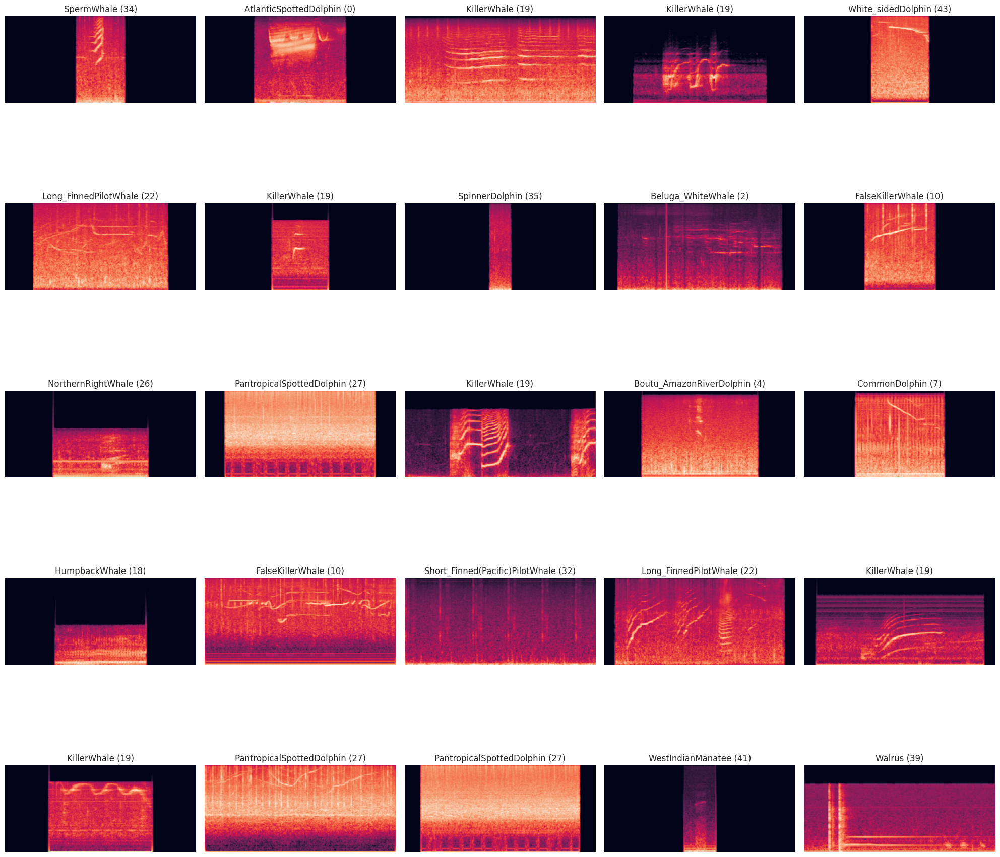

In [29]:
# take 25 random samples of different classes and plot in a grid with its class
# Select 25 random samples
random_samples = df_train.sample(25, random_state=42)

# Create a grid of plots
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes
axes = axes.ravel()

# Loop through all the samples

for i, (_, row) in enumerate(random_samples.iterrows()):
    # Load the audio file
    signal, sr = librosa.load(row['File'], sr=48000)

    # preprocess the audio
    processed_audios = preprocess_audio(row['File'], target_sr=48000, duration=3)
    
    # Calculate the mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=processed_audios[0], sr=48000)
    mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    
    # Plot the mel spectrogram
    axes[i].imshow(mel_spectrogram, origin='lower')
    axes[i].set_title(f"{row['Class']} ({classes_mapping[row['Class']]})")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Data Generators

## Data Augmentation

In [30]:
from pydub import AudioSegment

def add_noise(signal, noise_factor=0.005):
    noise = np.random.randn(len(signal))
    augmented_signal = signal + noise_factor * noise
    return augmented_signal

def shift_time(signal, shift_max=0.4):
    shift = np.random.randint(int(shift_max * len(signal)))
    augmented_signal = np.roll(signal, shift)
    return augmented_signal

# Mix Up
def mix_up(signal1, signal2, alpha=0.5):
    mixed_signal = alpha * signal1 + (1 - alpha) * signal2
    return mixed_signal

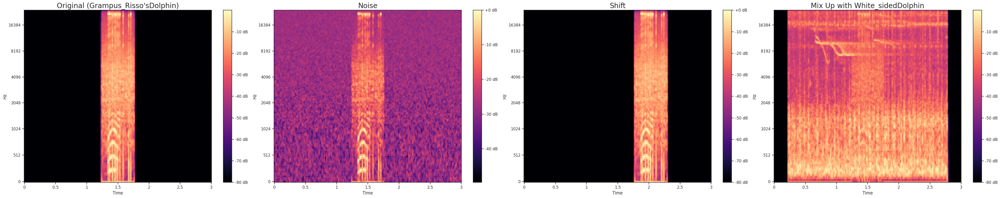

In [31]:
# Check data augmentation in the same audio, plot the original and the augmented audio with each of the changes
# Load the audio file
sample_file = df_train['File'][0]
sample_file_1 = df_train['File'][1]
signal, sr = librosa.load(sample_file, sr=48000)
signal_1, sr_1 = librosa.load(sample_file_1, sr=48000)

# preprocess the audio
signal = preprocess_audio(sample_file, target_sr=48000, duration=3)[0]
signal_1 = preprocess_audio(sample_file_1, target_sr=48000, duration=3)[0]

# Add noise
augmented_signal_noise = add_noise(signal, noise_factor=0.005)

# Shift time
augmented_signal_shift = shift_time(signal, shift_max=0.2)

# Mix up
augmented_signal_mix_up = mix_up(signal, signal_1, alpha=0.5)

# Mel spectrograms
mel_spectrogram = librosa.feature.melspectrogram(y=signal, sr=48000)
mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

mel_spectrogram_noise = librosa.feature.melspectrogram(y=augmented_signal_noise, sr=48000)
mel_spectrogram_noise = librosa.power_to_db(mel_spectrogram_noise, ref=np.max)

mel_spectrogram_shift = librosa.feature.melspectrogram(y=augmented_signal_shift, sr=48000)
mel_spectrogram_shift = librosa.power_to_db(mel_spectrogram_shift, ref=np.max)

mel_spectrogram_mix_up = librosa.feature.melspectrogram(y=augmented_signal_mix_up, sr=48000)
mel_spectrogram_mix_up = librosa.power_to_db(mel_spectrogram_mix_up, ref=np.max)

# Visualize mel spectrogram
plt.figure(figsize=(40, 8))
plt.subplot(1, 4, 1)
librosa.display.specshow(mel_spectrogram, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title(f'Original ({df_train["Class"][0]})', fontsize=20)
plt.tight_layout()

plt.subplot(1, 4, 2)
librosa.display.specshow(mel_spectrogram_noise, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Noise', fontsize=20)
plt.tight_layout()

plt.subplot(1, 4, 3)
librosa.display.specshow(mel_spectrogram_shift, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Shift', fontsize=20)
plt.tight_layout()

plt.subplot(1, 4, 4)
librosa.display.specshow(mel_spectrogram_mix_up, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title(f'Mix Up with {df_train["Class"][1]}', fontsize=20)
plt.tight_layout()

In [ ]:
def audio_data_generator(df, classes_list, classes_mapping, batch_size=32, target_sr=48000, duration=3, augment=False, df_background=[]):
    while True:
        X, y = [], []
        for _, row in df.iterrows():
            file_path = row['File']
            cls_index = classes_mapping[row['Class']] # Ensure it is the same classes mapping
            signals = preprocess_audio(file_path, target_sr, duration)
            for signal in signals:
                if augment:
                    if np.random.rand() < 0.5:
                        signal = add_noise(signal)
                    if np.random.rand() < 0.5:
                        signal = shift_time(signal)
                    if np.random.rand() < 0.5:
                        # If background noise is provided
                        if len(df_background) > 0:
                            signal_1 = preprocess_audio(df_background['File'][np.random.randint(0, len(df_background))], target_sr=48000, duration=3)[0]
                            signal = mix_up(signal, signal_1, alpha=0.5)
                        else:
                            signal_1 = preprocess_audio(df['File'][np.random.randint(0, len(df))], target_sr=48000, duration=3)[0]
                            signal = mix_up(signal, signal_1, alpha=0.5)
                
                X.append(signal)
                y.append(cls_index)
                
                if len(X) == batch_size:
                    X = np.array(X)
                    y = np.array(y)
                    yield X, to_categorical(y, num_classes=len(classes_list))
                    X, y = [], []

def audio_data_generator_test(df, classes_list, classes_mapping, batch_size=32, target_sr=48000, duration=3, augment=False, df_background=[]):
    while True:
        XPath, X_segment, XSignal, y = [], [], [], []
        for _, row in df.iterrows():
            file_path = row['File']
            cls_index = classes_mapping[row['Class']] # Ensure it is the same classes mapping
            signals = preprocess_audio(file_path, target_sr, duration)
            segment_idx = 0
            for signal in signals:
                if augment:
                    if np.random.rand() < 0.5:
                        signal = add_noise(signal)
                    if np.random.rand() < 0.5:
                        signal = shift_time(signal)
                    if np.random.rand() < 0.5:
                        # If background noise is provided
                        if len(df_background) > 0:
                            signal_1 = preprocess_audio(df_background['File'][np.random.randint(0, len(df_background))], target_sr=48000, duration=3)[0]
                            signal = mix_up(signal, signal_1, alpha=0.5)
                        else:
                            signal_1 = preprocess_audio(df['File'][np.random.randint(0, len(df))], target_sr=48000, duration=3)[0]
                            signal = mix_up(signal, signal_1, alpha=0.5)
                
                XPath.append(file_path)
                X_segment.append(segment_idx)
                XSignal.append(signal)
                y.append(cls_index)

                segment_idx += 1
                
                if len(XSignal) == batch_size:
                    XSignal = np.array(XSignal)
                    y = np.array(y)
                    yield XPath, X_segment, XSignal, to_categorical(y, num_classes=len(classes_list))
                    XPath, X_segment, XSignal, y = [], [], [], []

# Test the generator with test_Df
test_gen = audio_data_generator(df_test, classes, batch_size=32, target_sr=48000, duration=3)
X, y = next(test_gen)
print(X.shape, y.shape)

(32, 144000) (32, 44)


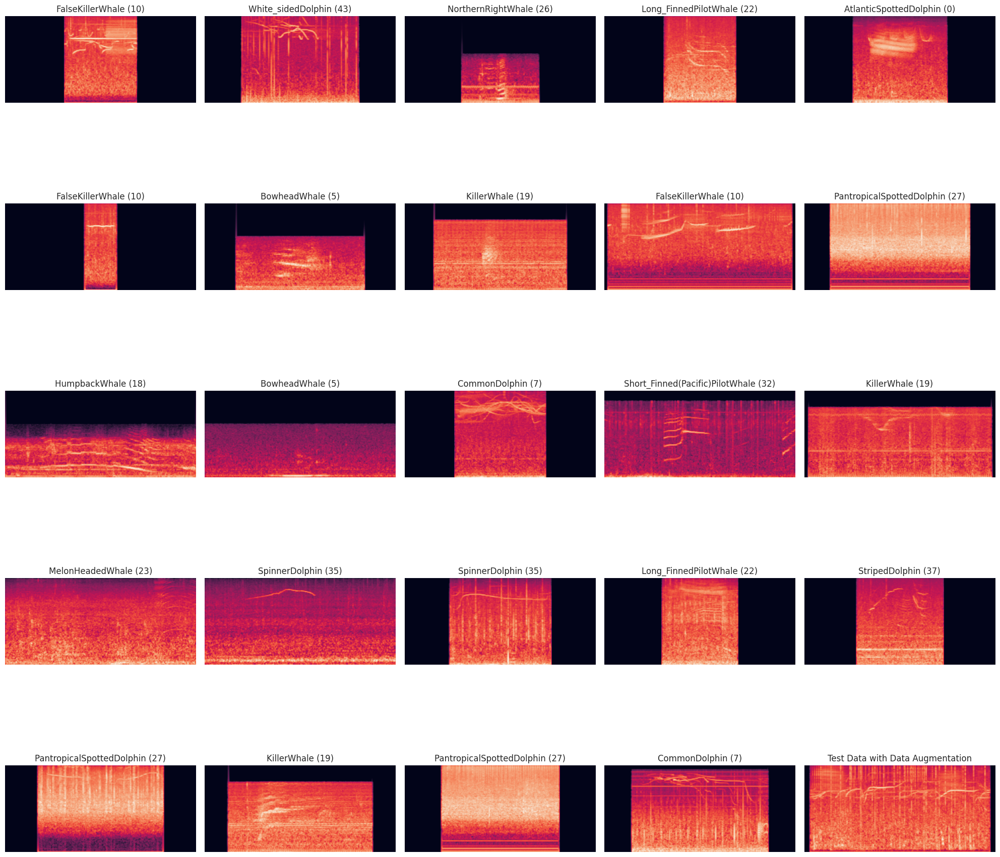

In [33]:
# take 25 random samples of different classes and plot in a grid with its class
# Select 25 random samples
random_samples = df_test.sample(25, random_state=42)

# Create a grid of plots
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes
axes = axes.ravel()

# Loop through all the samples

for i, (_, row) in enumerate(random_samples.iterrows()):
    # Load the audio file
    signal, sr = librosa.load(row['File'], sr=48000)

    # preprocess the audio
    processed_audios = preprocess_audio(row['File'], target_sr=48000, duration=3)
    
    # Calculate the mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=processed_audios[0], sr=48000)
    mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    
    # Plot the mel spectrogram
    axes[i].imshow(mel_spectrogram, origin='lower')
    axes[i].set_title(f"{row['Class']} ({classes_mapping[row['Class']]})")
    axes[i].axis('off')

plt.tight_layout()
plt.title('Test Data with Data Augmentation')
plt.show()

# Model Functions

In [ ]:
import warnings
warnings.filterwarnings('ignore')

def load_base_model(model_path = 'BirdNET-Analyzer-V2.4/V2.4/BirdNET_GLOBAL_6K_V2.4_Model/', freeze = True, n_freeze = 4):
    model = tf.keras.models.load_model(model_path, compile=False).model

    # Get the output of the second to last layer
    output_layer = model.layers[-2].output

    # Add 3 dense layers: 512, 128 and len(classes)

    # Add a dense layer with 512 units and ReLU activation
    x = tf.keras.layers.Dense(512, activation='relu')(output_layer)

    # Add a dense layer with 128 units and ReLU activation
    x = tf.keras.layers.Dense(128, activation='relu')(x)

    # Add a dense layer with the number of classes and softmax activation
    output_layer = tf.keras.layers.Dense(len(classes), activation='softmax')(x)

    # output_layer = tf.keras.layers.Dense(len(classes), activation='softmax')(model.output)

    # Create a new model
    model = tf.keras.models.Model(inputs=model.input, outputs=output_layer)

    # Compile
    # model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', 'AUC', 'Precision', 'Recall', 'Sensitivity', 'TruePositives', 'TrueNegatives', 'FalsePositives', 'FalseNegatives', 'CategoricalAccuracy', 'F1Score'])

    if freeze:
        # Freeze first layers
        for layer in model.layers[:-n_freeze]:
            layer.trainable = False

    print(model.summary())

    return model

def model_compile(model, optimizer = "adam", loss = "categorical_crossentropy", metrics = ['accuracy']):
    # Compile
    model.compile(
        optimizer=optimizer, 
        loss=loss, 
        metrics=metrics
        ) 
    
    return model

def train_model(model, df_train, df_val, classes, classes_mapping, batch_size=8, target_sr=48000, duration=3, epochs=100, callbacks=None, doshuffle=True, doDataAugmentation=False, df_background=[]):
    # Training and Validation Generators

    # shuffle data
    if doshuffle:
        df_train = shuffle(df_train, random_state=42)
        df_val = shuffle(df_val, random_state=42)

    train_gen = audio_data_generator(df_train, classes, classes_mapping, batch_size=batch_size, target_sr=target_sr, duration=duration, augment=doDataAugmentation, df_background=df_background)
    val_gen = audio_data_generator(df_val, classes, classes_mapping, batch_size=batch_size, target_sr=target_sr, duration=duration)

    total_segments_train = int(df_train['Duration'].sum() / duration)
    total_segments_val = int(df_val['Duration'].sum() / duration)

    # Calculate steps per epoch and validation steps
    steps_per_epoch = total_segments_train // batch_size
    validation_steps = total_segments_val // batch_size

    # Train the model
    history = model.fit(
        train_gen,
        validation_data=val_gen,
        shuffle=doshuffle,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )

    return model, history

def plot_training_monitoring(history):
    # Plot accuracy and loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.legend()
    plt.title("Accuracy")

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.legend()
    plt.title("Loss")

    plt.show()

def evaluate_model(model, df_test, classes, batch_size=1, target_sr=48000, duration=3, plot_confusion_matrix=True):
    # Evaluate on test data
    test_gen = audio_data_generator(df_test, classes, batch_size=1)

    test_steps = len(df_test) // 1

    results = model.evaluate(test_gen, steps=test_steps)
    print(f"Test Loss: {results[0]}, Test Accuracy: {results[1]}")

    # Sample same samples from test set and predict
    X_eval, y_true = next(audio_data_generator(df_test, classes, batch_size=batch_size, target_sr=target_sr, duration=duration))
    y_predicted = model.predict(X_eval)

    # Get the predicted classes and confidence
    y_pred_classes = np.argmax(y_predicted, axis=1)
    y_pred_confidence = np.max(y_predicted, axis=1)

    y_pred = np.vstack((y_pred_classes, y_pred_confidence))
    y_true = np.argmax(y_true, axis=1)

    # Accuracy manual
    # accuracy_manual = np.mean(y_pred_classes == y_true)
    # print(f"Accuracy from model.evaluate: {results[1]}")
    # print(f"Manual accuracy: {accuracy_manual}")

    if plot_confusion_matrix:
        # Plot confusion matrix
        cm = confusion_matrix(y_true, y_pred_classes)
        plt.figure(figsize=(30, 30))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

        # Normalized by rows
        cm_normalized = cm / cm.sum(axis=1)[:, np.newaxis]
        plt.figure(figsize=(30, 30))
        sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
        plt.title('Normalized Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

    # Put together X_eval, y_true, y_pred_classes, y_pred_confidence
    df_results = pd.DataFrame({
        'Signal': list(X_eval),
        'True': y_true,
        'Predicted': y_pred_classes,
        'PredictedClass': [reverse_classes_mapping[p] for p in y_pred_classes],
        'Confidence': y_pred_confidence
    })

    return df_results

# Experiment 0: Base Model with Full Best of Watkins Dataset

In [86]:
from private_credentials import API_COMETML
experiment = start(
  api_key=API_COMETML,
  project_name="Cetaceans",
  workspace="gruncrow",
)

COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/gruncrow/cetaceans/6a9646167ecf4bcc8d33bbf66099225d



## Load and compile model

In [87]:
EXPERIMENT = "0_WatkinsMarineMammals_Base"

OPTIMIZER = "adam"
LOSS = "categorical_crossentropy"
METRICS = ['accuracy'] # , 'AUC', 'Precision', 'Recall', 'Sensitivity', 'TruePositives', 'TrueNegatives', 'FalsePositives', 'FalseNegatives', 'CategoricalAccuracy', 'F1Score'

BATCH_SIZE = 8
EPOCHS = 100
SHUFFLE = True

# Callbacks
CALLBACKS = [
    ModelCheckpoint(f"Models/{EXPERIMENT}/best_model.h5", save_best_only=True, monitor="val_accuracy", mode="max", verbose=1),
    EarlyStopping(patience=10, restore_best_weights=True, monitor="val_accuracy", mode="max", verbose=1),
    CSVLogger(f"Models/{EXPERIMENT}/training_log.csv", append=True),
    LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch / 20)),
    ReduceLROnPlateau(factor=0.1, patience=5, verbose=1)
]

In [88]:
model = load_base_model()
model = model_compile(model, optimizer=OPTIMIZER, loss=LOSS, metrics=METRICS)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 INPUT (InputLayer)          [(None, 144000)]             0         []                            
                                                                                                  
 MEL_SPEC1 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                                  
 MEL_SPEC2 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                            

## Train Model

In [91]:
model, history = train_model(model, df_train, df_val, classes, batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=CALLBACKS, doshuffle=SHUFFLE)

COMET INFO: Ignoring automatic log_parameter('verbose') because 'keras:verbose' is in COMET_LOGGING_PARAMETERS_IGNORE


Epoch 1/100
1553/1553 [==============================] - ETA: 0s - loss: 1.5219 - accuracy: 0.6154
Epoch 1: val_accuracy improved from -inf to 0.60052, saving model to Models/0_WatkinsMarineMammals_Base/best_model.h5
1553/1553 [==============================] - 330s 204ms/step - loss: 1.5219 - accuracy: 0.6154 - val_loss: 1.8393 - val_accuracy: 0.6005 - lr: 1.0000e-04
Epoch 2/100
1553/1553 [==============================] - ETA: 0s - loss: 0.9104 - accuracy: 0.7681
Epoch 2: val_accuracy improved from 0.60052 to 0.84601, saving model to Models/0_WatkinsMarineMammals_Base/best_model.h5
1553/1553 [==============================] - 310s 200ms/step - loss: 0.9104 - accuracy: 0.7681 - val_loss: 0.5523 - val_accuracy: 0.8460 - lr: 1.1220e-04
Epoch 3/100
1553/1553 [==============================] - ETA: 0s - loss: 0.7549 - accuracy: 0.7907
Epoch 3: val_accuracy did not improve from 0.84601
1553/1553 [==============================] - 312s 201ms/step - loss: 0.7549 - accuracy: 0.7907 - val_loss

In [92]:
model.save(f"Models/{EXPERIMENT}/")

INFO:tensorflow:Assets written to: Models/0_WatkinsMarineMammals_Base/assets


INFO:tensorflow:Assets written to: Models/0_WatkinsMarineMammals_Base/assets


## Monitor Training

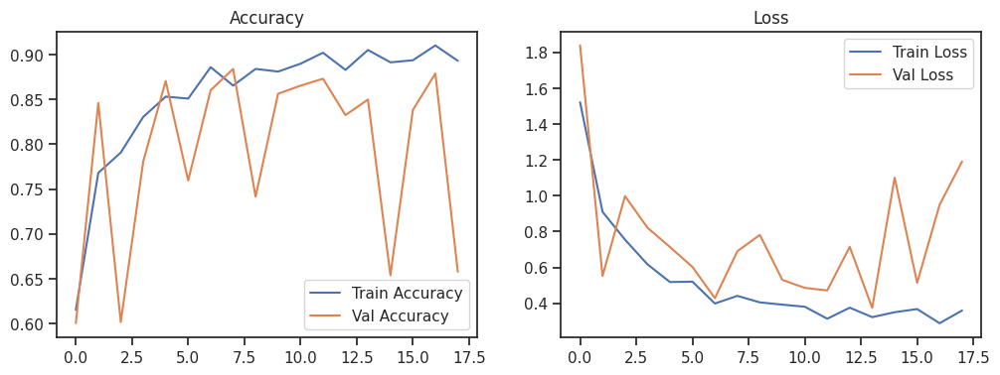

In [93]:
plot_training_monitoring(history)

In [35]:
import tensorflow as tf
EXPERIMENT = "0_WatkinsMarineMammals_Base"
# Load model
model = tf.keras.models.load_model(f"Models/{EXPERIMENT}/")

## Evaluate Model

1554/1554 [==============================] - 42s 27ms/step - loss: 0.3409 - accuracy: 0.9015
Test Loss: 0.3408795893192291, Test Accuracy: 0.9015443921089172


2024-11-28 09:58:36.847103: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 895104000 exceeds 10% of free system memory.
2024-11-28 09:58:39.598903: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 133955584 exceeds 10% of free system memory.
2024-11-28 09:58:39.674260: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 134086400 exceeds 10% of free system memory.


 1/49 [..............................] - ETA: 1:17

2024-11-28 09:58:40.226657: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 133955584 exceeds 10% of free system memory.
2024-11-28 09:58:40.282747: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 134086400 exceeds 10% of free system memory.


49/49 [==============================] - 29s 573ms/step


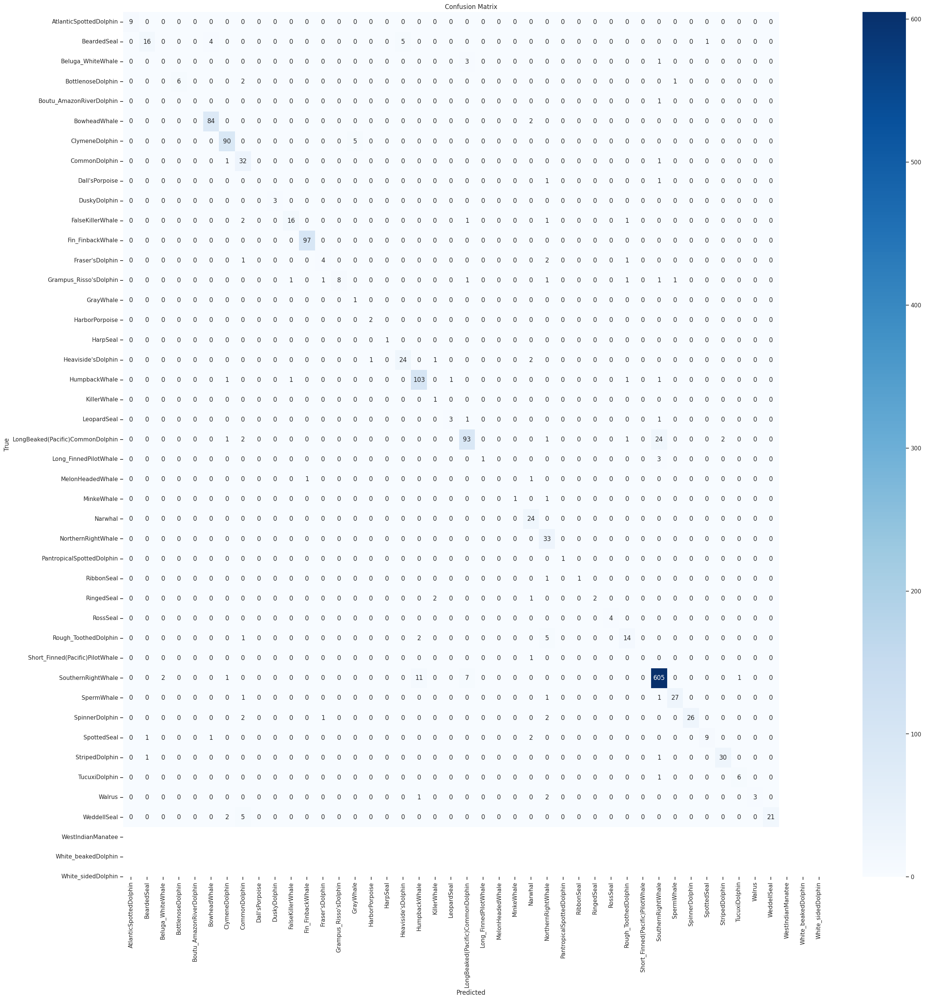

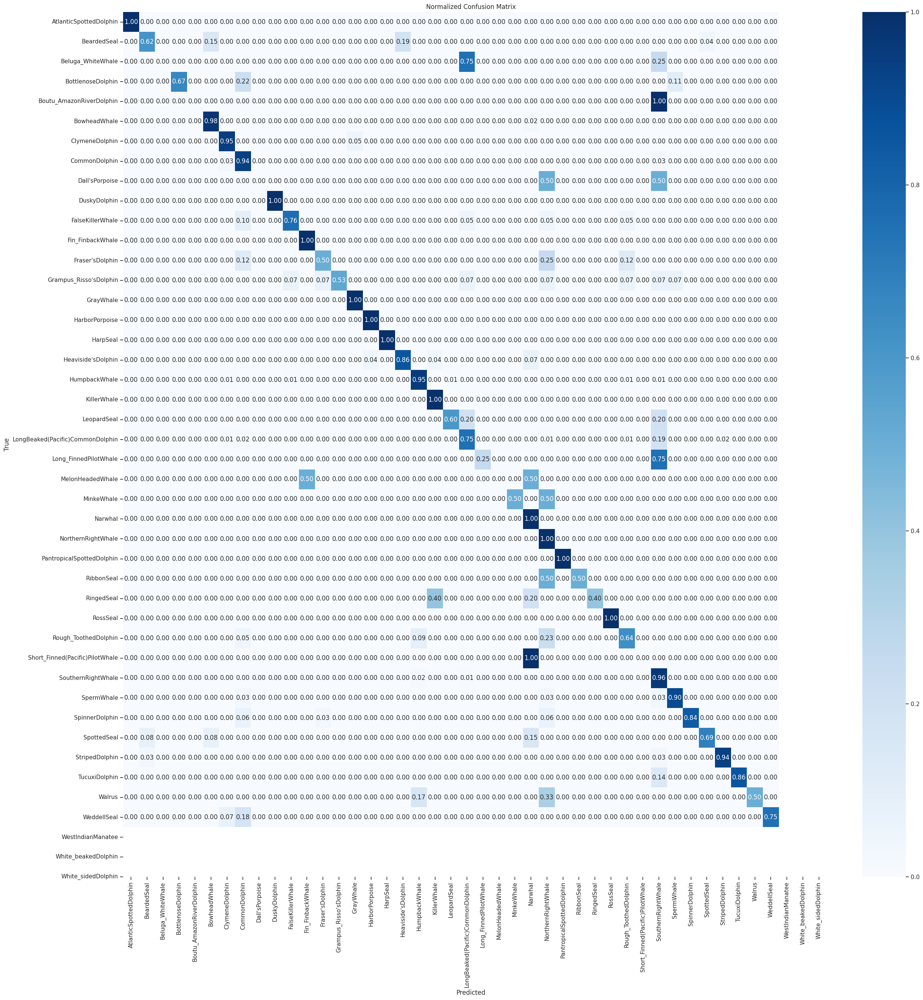

In [36]:
TEST_BATCH_SIZE = len(df_test)

df_results = evaluate_model(model, df_test, classes, batch_size=TEST_BATCH_SIZE)

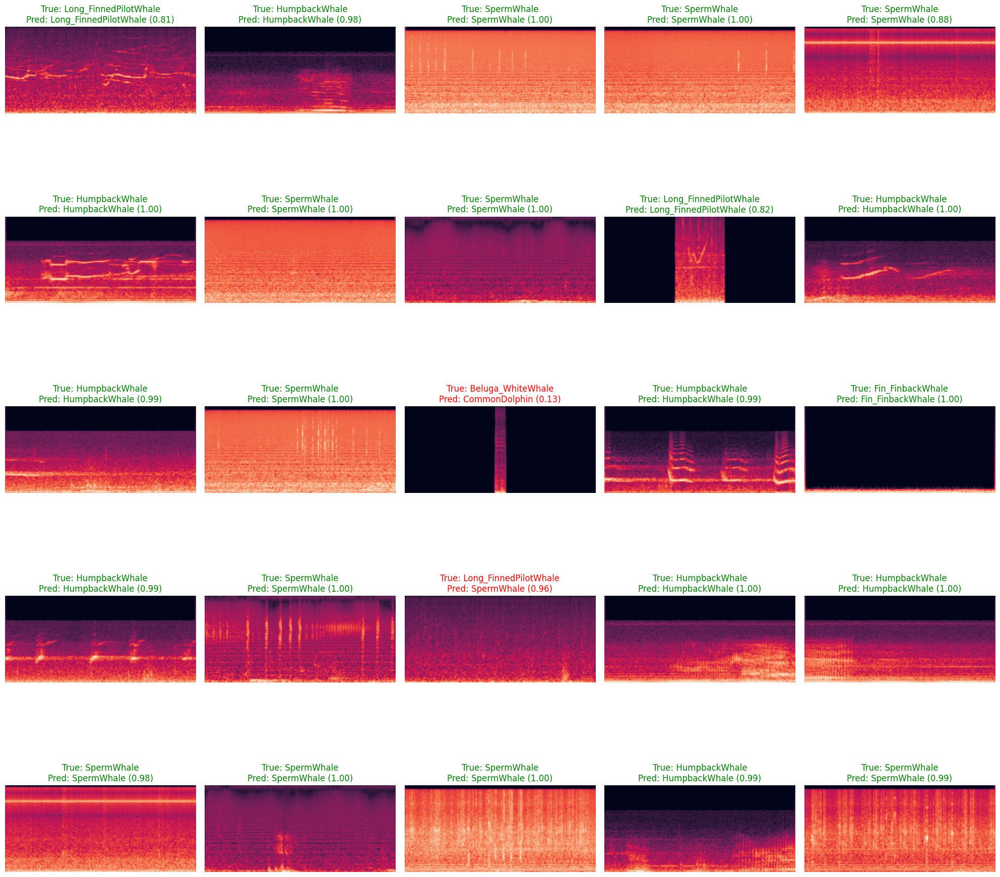

In [96]:
# Plot 25 random samples
# Create a grid of plots
plot_results(df_results, mode='random')

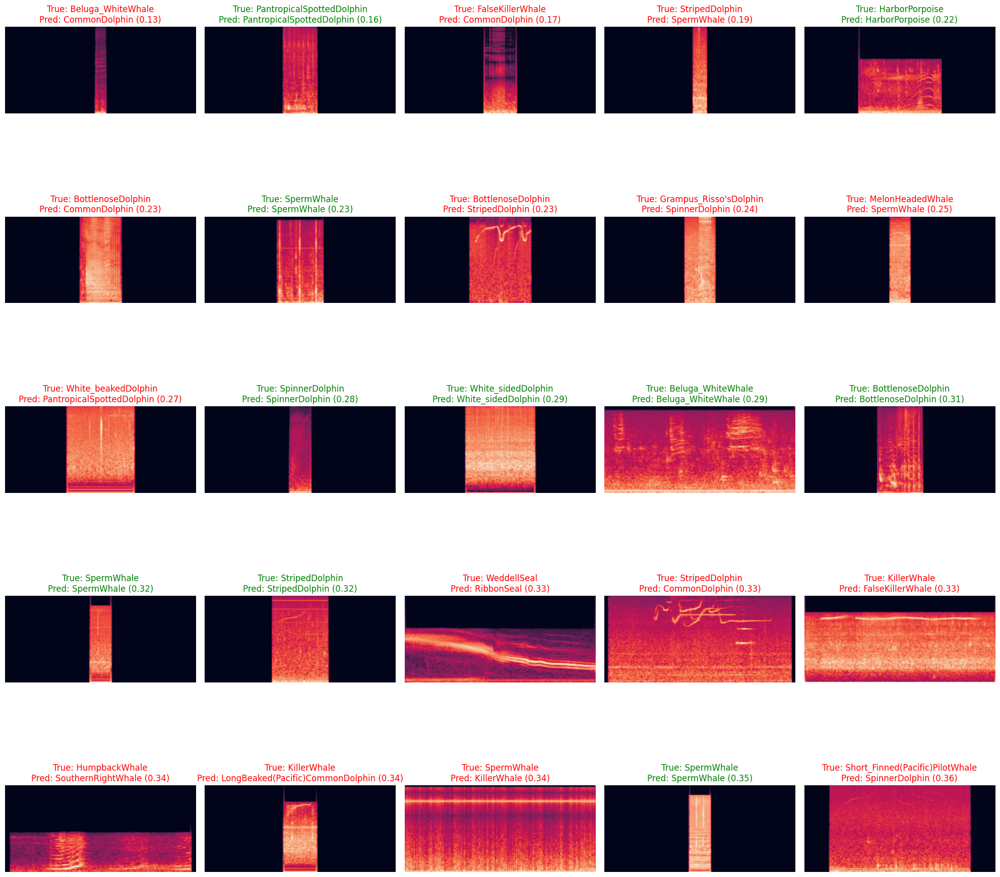

In [97]:
# Select 25 samples with lowest confidence
plot_results(df_results, mode='min')

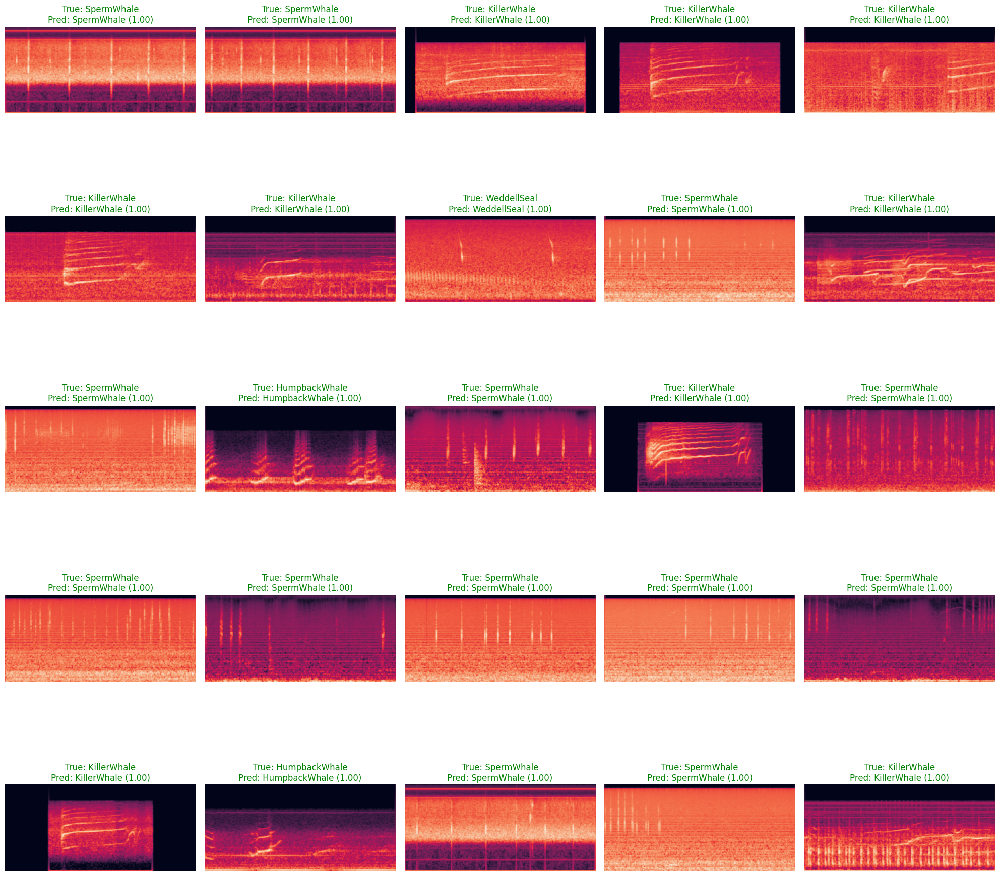

In [98]:
# Select 25 samples with highest confidence
plot_results(df_results, mode='max')

In [99]:
experiment.end()

COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary


COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : intelligent_minnow_4621
COMET INFO:     url                   : https://www.comet.com/gruncrow/cetaceans/6a9646167ecf4bcc8d33bbf66099225d
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     accuracy [18]                 : (0.6154217720031738, 0.9101738333702087)
COMET INFO:     batch_accuracy [2808]         : (0.0, 1.0)
COMET INFO:     batch_loss [2808]             : (9.939268056768924e-05, 4.290949821472168)
COMET INFO:     epoch_duration [18]           : (210.707566890007, 329.6923552299995)
COMET INFO:     loss [18]                     : (0.2884398400783539, 1.5218664407730103)
COMET INFO:     lr [18]                       : (9.999999747378752e-05, 0.0007079457864165306)
COMET INFO:     val_accuracy [18]             : (0.6005154848098755, 0.8840206265449524)
COMET INFO:     val_

In [101]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 INPUT (InputLayer)          [(None, 144000)]             0         []                            
                                                                                                  
 MEL_SPEC1 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                                  
 MEL_SPEC2 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                            

In [181]:
# traspose test_signal and show shape (it's 144000,None and it has to be None,144000)
test_signal = df_results['Signal'][0]
test_signal.shape

# Transpose the signal
test_signal = test_signal.reshape(1, -1)
test_signal.shape

(1, 144000)

In [182]:
from tensorflow.keras.models import Model
import numpy as np
import matplotlib.pyplot as plt
import cv2

# take 1 random test sample and plot the heatmap overlay on the spectrogram
raw_test_signal = df_results['Signal'][0]
test_signal = raw_test_signal.reshape(1, -1)

# Create intermediate models for each relevant layer
mel_spec1_model = Model(inputs=model.input, outputs=[model.get_layer("MEL_SPEC1").output, model.get_layer("dense_8").output])
mel_spec2_model = Model(inputs=model.input, outputs=[model.get_layer("MEL_SPEC2").output, model.get_layer("dense_8").output])
concat_model = Model(inputs=model.input, outputs=[model.get_layer("concatenate").output, model.get_layer("dense_8").output])
heatmap_model = Model(inputs=model.input, outputs=[model.get_layer("POST_ACT_1").output, model.get_layer("dense_8").output])

# Generate intermediate outputs
mel_spec1_conv, mel_spec1_pred = mel_spec1_model.predict(test_signal)  # Shape: (1, 96, 511, 1)
mel_spec2_conv, mel_spec2_pred = mel_spec2_model.predict(test_signal)  # Shape: (1, 96, 511, 1)
concat_conv, concat_pred = concat_model.predict(test_signal)        # Shape: (1, 96, 511, 2)
heatmap_conv, heatmap_pred = heatmap_model.predict(test_signal)      # Shape: (1, 3, 8, 192)

# decode predictions
mel_spec1_pred = np.argmax(mel_spec1_pred, axis=1)
mel_spec2_pred = np.argmax(mel_spec2_pred, axis=1)
concat_pred = np.argmax(concat_pred, axis=1)
heatmap_pred = np.argmax(heatmap_pred, axis=1)

target_mel_spec1 = mel_spec1_pred[0]
target_mel_spec2 = mel_spec2_pred[0]
target_concat = concat_pred[0]
target_heatmap = heatmap_pred[0]


1/1 [==============================] - 2s 2s/step


In [ ]:
# Get the weights of the last layer
w, b = heatmap_model.get_layer("dense_8").get_weights()
weights = w[:, target_heatmap]

# Reshape heatmap_conv to match the dimensions for matrix multiplication
heatmap_conv_reshaped = heatmap_conv.reshape(-1, heatmap_conv.shape[-1])

# Compute the heatmap
heatmap = heatmap_conv_reshaped @ weights

# Reshape the heatmap back to the original spatial dimensions
heatmap = heatmap.reshape(heatmap_conv.shape[1], heatmap_conv.shape[2])

# Resize heatmap to match the dimensions of concat_conv
heatmap_resized = cv2.resize(heatmap, (concat_conv.shape[2], concat_conv.shape[1]), interpolation=cv2.INTER_LINEAR)

plt.figure(figsize=(12, 12))
plt.imshow(concat_conv.squeeze(), cmap='jet', alpha=0.5)
plt.imshow(heatmap_resized, cmap='jet', alpha=0.5)
plt.colorbar()
plt.title('Heatmap Overlay')
plt.show()

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 128 is different from 1024)

: 

In [ ]:
# Prepare data for plotting
mel_spec1 = mel_spec1_conv[0, :, :, 0]  # Remove batch and channel dims
mel_spec2 = mel_spec2_conv[0, :, :, 0]
concat_mean = np.mean(concat_conv[0], axis=-1)  # Average across last axis
heatmap = np.mean(heatmap_conv[0], axis=-1)     # Average across last axis (reduce channels)
heatmap_resized = cv2.resize(heatmap, (concat_mean.shape[1], concat_mean.shape[0]), interpolation=cv2.INTER_LINEAR)

mel_spectrogram = librosa.feature.melspectrogram(y=raw_test_signal, sr=48000)
mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

# Plotting
fig, axes = plt.subplots(1, 5, figsize=(20, 5))

# Plot 1: Input Spectrogram
axes[0].imshow(mel_spectrogram, aspect='auto')
axes[0].set_title("Input Mel Spectrogram")
axes[0].axis("off")

# Plot 2: First Mel Spectrogram
axes[1].imshow(mel_spec1, cmap='gray', aspect='auto')
axes[1].set_title("First Mel Spectrogram (MEL_SPEC1)")
axes[1].axis("off")

# Plot 3: Second Mel Spectrogram
axes[2].imshow(mel_spec2, aspect='auto')
axes[2].set_title("Second Mel Spectrogram (MEL_SPEC2)")
axes[2].axis("off")

# Plot 4: Concatenated Spectrogram
axes[3].imshow(concat_mean, aspect='auto')
axes[3].set_title("Concatenated Spectrogram")
axes[3].axis("off")

# Plot 5: Heatmap Overlay on Concatenated
axes[4].imshow(concat_mean, aspect='auto')
axes[4].imshow(heatmap_resized, cmap='hot', alpha=0.4)
axes[4].set_title("Heatmap on Concatenated")
axes[4].axis("off")

# Adjust layout and show
plt.tight_layout()
plt.show()